In [1]:
# Customer Segmentation using K-Means clustering (RFM)
# Which month has more sales happen 
# WHich part of the week, customer go shopping 
# Overall Sales throught the quaters
# How many orders per invoice
# Whats the avg price per order
# Revenue by country 
# What are the most bought products
# How many online customers are there in the dataset and what is their country of origin?
# What are the countries that are most represented in the dataset?
# Calculate the revenue that was made in each month and what is the percentage revenue based on countries?
# Build a machine learning model to estimate if a given customer will buy something again from the online shop in the next quarter.

In [2]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt 
import requests
import plotly.express as px
import missingno as msno
import warnings
import scipy.stats as stats


from io import StringIO
from sklearn.preprocessing import LabelEncoder
from datetime import datetime
from tqdm import tqdm 


label_encoder = LabelEncoder()
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
warnings.filterwarnings('ignore')

In [3]:
data1=pd.read_csv('Online Retail.csv')
data2=pd.read_csv('online_retail_II.csv')

In [4]:
display(data1.head())

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [5]:
display(data2.head())

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,12/1/2009 7:45,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,12/1/2009 7:45,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,12/1/2009 7:45,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,12/1/2009 7:45,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,12/1/2009 7:45,1.25,13085.0,United Kingdom


In [6]:
print(f'''Data1 Column names
{data1.columns}
-------------------------
Data2 Column names:
{data2.columns}''')

Data1 Column names
Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')
-------------------------
Data2 Column names:
Index(['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'Price', 'Customer ID', 'Country'],
      dtype='object')


In [7]:
# Renaming Column names 
column_mapping = {
    'Invoice': 'InvoiceNo',
    'Price': 'UnitPrice',
    'Customer ID': 'CustomerID',
}

data2.rename(columns=column_mapping, inplace=True)

print(data2.columns)

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')


In [8]:
data = pd.merge(data1, data2, how='outer')
print(f'''Data1 Shape:{data1.shape},
Data2 Shape:{data2.shape},
Data Shape:{data.shape}''')

Data1 Shape:(541909, 8),
Data2 Shape:(525461, 8),
Data Shape:(1045545, 8)


In [9]:
def table_summary(data):
    summary_data = []
    
    for column in data.columns:
        num_unique_values = data[column].nunique()
        num_empty_values = data[column].isnull().sum()
        data_type = data[column].dtypes
        percentage_empty = (num_empty_values / len(data)) * 100
        summary_data.append([column, num_unique_values, num_empty_values, percentage_empty, data_type])

    summary_df = pd.DataFrame(summary_data, columns=['Column Name', 'Unique Values', 'Empty Values', 'Percentage Empty', 'Data Type'])

    print(f'''Table Summary
Dataframe Shape: {data.shape}''')
    
    
    display(summary_df)
    msno.matrix(data)
    plt.title('Missing Values Overview', fontsize=16)
    plt.xlabel('Columns', fontsize=14)
    plt.ylabel('Percentage of Missing Values', fontsize=14)
    plt.show()

Table Summary
Dataframe Shape: (1045545, 8)


,Column Name,Unique Values,Empty Values,Percentage Empty,Data Type
0,InvoiceNo,53628,0,0.000000,object
1,StockCode,5305,0,0.000000,object
2,Description,5698,4275,0.408878,object
3,Quantity,1057,0,0.000000,int64
4,InvoiceDate,47635,0,0.000000,object
5,UnitPrice,2807,0,0.000000,float64
6,CustomerID,5942,235289,22.503957,float64
7,Country,43,0,0.000000,object


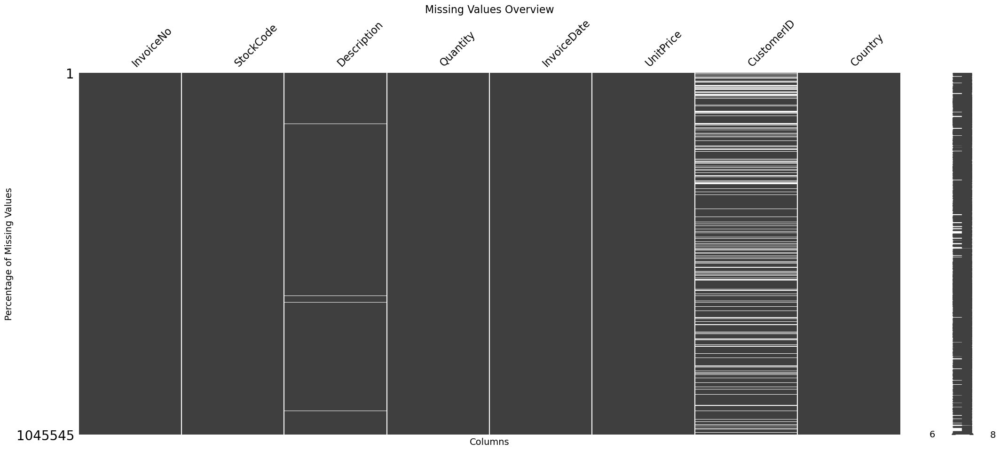

In [10]:
table_summary(data)

We have missing values in the `Description` column. Initially, I'll examine whether these missing values are associated with valid `StockCode` entries and determine if there are corresponding descriptions for those `StockCode` entries.

In [11]:
desc_nan=data[data['Description'].isnull()]
display(desc_nan.head())

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
658,536414,22139,NaN,56,12/1/2010 11:52,0.0,NaN,United Kingdom
2046,536545,21134,NaN,1,12/1/2010 14:32,0.0,NaN,United Kingdom
2047,536546,22145,NaN,1,12/1/2010 14:33,0.0,NaN,United Kingdom
2048,536547,37509,NaN,1,12/1/2010 14:33,0.0,NaN,United Kingdom
2063,536549,85226A,NaN,1,12/1/2010 14:34,0.0,NaN,United Kingdom


In [12]:
# getting the list of unique StockCode from desc_nan dataset
stockcodes_list = list(desc_nan['StockCode'].unique())

# filtering the 'data' dataset containing only the StockCode from stockcodes_list
mask = data['StockCode'].isin(stockcodes_list)
filtered_data = data[mask]

# Display the rows with StockCodes in the list and non-null Descriptions
display(filtered_data.head())

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,12/1/2010 8:26,7.65,17850.0,United Kingdom
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,12/1/2010 8:26,4.25,17850.0,United Kingdom


In [13]:
filtered_data.shape

(375540, 8)

In [14]:
# Fill missing values in the 'Description' column by replacing them with the available descriptions associated with the respective 'StockCode' if such descriptions exist.

# Identify unique StockCodes where Description is NaN
missing_description_stockcodes = desc_nan['StockCode'].unique()

# go through each StockCodes
for stockcode in tqdm(missing_description_stockcodes):
    # Check if there are non-null Descriptions for the current StockCode
    non_null_descriptions = data[data['StockCode'] == stockcode]['Description'].dropna()

    if not non_null_descriptions.empty:
        # If non-null Descriptions exist, fill in missing values with the first non-null Description
        fill_value = non_null_descriptions.iloc[0]
        condition = (data['StockCode'] == stockcode) & (data['Description'].isnull())
        data.loc[condition, 'Description'] = fill_value

100%|███████████████████████████████████████| 2451/2451 [03:07<00:00, 13.05it/s]


In [15]:
def count_unique_values(data, columns):
    summary_data = []
    for column in columns:
        num_unique_values = data[column].nunique()
        summary_data.append([column, num_unique_values])
    summary_df = pd.DataFrame(summary_data, columns=['Column Name', 'Unique Values'])
    display(summary_df)
count_unique_values(data,['StockCode','Description'])

,Column Name,Unique Values
0,StockCode,5305
1,Description,5698


In [16]:
# Group by 'StockCode' and count the unique 'Description' values
stockcode_description_counts = data.groupby('StockCode')['Description'].nunique()

# Filter StockCodes with more than one unique Description
stockcodes_with_multiple_descriptions = stockcode_description_counts[stockcode_description_counts > 1].index.tolist()




In [17]:
# Filter rows with StockCodes having more than one unique Description
multiple_description_stockcodes = stockcode_description_counts[stockcode_description_counts > 1].index

# Create a DataFrame containing StockCodes with multiple Descriptions
multiple_description_data = data[data['StockCode'].isin(multiple_description_stockcodes)]

# Group by 'StockCode' and collect unique 'Description' values
stockcode_descriptions_multiple = multiple_description_data.groupby('StockCode')['Description'].unique().reset_index()

# Display the result
display(stockcode_descriptions_multiple.head())

,StockCode,Description
0,10080,"[GROOVY CACTUS INFLATABLE, check]"
1,10120,"[DOGGY RUBBER, Zebra invcing error]"
2,10133,"[COLOURING PENCILS BROWN TUBE, damaged]"
3,15056N,"[EDWARDIAN PARASOL NATURAL, wedding co returns?]"
4,15058A,"[BLUE POLKADOT GARDEN PARASOL, wet/rusty, BLUE..."


In [18]:
# Iterate through StockCodes with multiple Descriptions
for stockcode in stockcodes_with_multiple_descriptions:
    # Get the first Description for the current StockCode
    first_description = data[data['StockCode'] == stockcode]['Description'].dropna().iloc[0]
    
    # Replace all Descriptions for the current StockCode with the first one
    data.loc[data['StockCode'] == stockcode, 'Description'] = first_description

In [19]:
count_unique_values(data,['StockCode','Description'])

,Column Name,Unique Values
0,StockCode,5305
1,Description,4743


In [20]:
# Filter rows with StockCodes having more than one unique Description
multiple_description_stockcodes = stockcode_description_counts[stockcode_description_counts > 1].index

# Create a DataFrame containing StockCodes with multiple Descriptions
multiple_description_data = data[data['StockCode'].isin(multiple_description_stockcodes)]

# Group by 'StockCode' and collect unique 'Description' values
stockcode_descriptions_multiple = multiple_description_data.groupby('StockCode')['Description'].unique().reset_index()

# Display the result
display(stockcode_descriptions_multiple.head())

,StockCode,Description
0,10080,[GROOVY CACTUS INFLATABLE]
1,10120,[DOGGY RUBBER]
2,10133,[COLOURING PENCILS BROWN TUBE]
3,15056N,[EDWARDIAN PARASOL NATURAL]
4,15058A,[BLUE POLKADOT GARDEN PARASOL]


In [21]:
# Group by 'Description' and collect unique 'StockCode' values
description_stockcodes_multiple = data.groupby('Description')['StockCode'].unique().reset_index()

# Filter rows where there are multiple unique StockCodes for a Description
description_stockcodes_multiple = description_stockcodes_multiple[description_stockcodes_multiple['StockCode'].apply(len) > 1]

# Display the result
display(description_stockcodes_multiple.head())



,Description,StockCode
49,3 GARDENIA MORRIS BOXED CANDLES,"[85034A, 85034a]"
63,3 WHITE CHOC MORRIS BOXED CANDLES,"[85034B, 85034b]"
74,3D DOG PICTURE PLAYING CARDS,"[84558A, 84558a]"
76,3D SHEET OF CAT STICKERS,"[84559B, 84559b]"
77,3D SHEET OF DOG STICKERS,"[84559A, 84559a]"


In [22]:
# Group by 'Description' and collect unique 'StockCode' values
description_stockcodes_multiple = data.groupby('Description')['StockCode'].unique().reset_index()

# Filter rows where there are multiple unique StockCodes for a Description
description_stockcodes_multiple = description_stockcodes_multiple[description_stockcodes_multiple['StockCode'].apply(len) > 1]

# Display the result
display(description_stockcodes_multiple.head())



,Description,StockCode
49,3 GARDENIA MORRIS BOXED CANDLES,"[85034A, 85034a]"
63,3 WHITE CHOC MORRIS BOXED CANDLES,"[85034B, 85034b]"
74,3D DOG PICTURE PLAYING CARDS,"[84558A, 84558a]"
76,3D SHEET OF CAT STICKERS,"[84559B, 84559b]"
77,3D SHEET OF DOG STICKERS,"[84559A, 84559a]"


In [23]:
# Group by 'Description' and collect unique 'StockCode' values
description_stockcodes_multiple = data.groupby('Description')['StockCode'].unique().reset_index()

# Filter rows where there are multiple unique StockCodes for a Description
description_stockcodes_multiple = description_stockcodes_multiple[description_stockcodes_multiple['StockCode'].apply(len) > 1]

# Display the result
display(description_stockcodes_multiple.head())

# Iterate through rows with multiple StockCodes for a Description
for index, row in description_stockcodes_multiple.iterrows():
    # Get the first StockCode for the current Description
    first_stockcode = row['StockCode'][0]
    
    # Replace all StockCodes for the current Description with the first one
    data.loc[data['Description'] == row['Description'], 'StockCode'] = first_stockcode


,Description,StockCode
49,3 GARDENIA MORRIS BOXED CANDLES,"[85034A, 85034a]"
63,3 WHITE CHOC MORRIS BOXED CANDLES,"[85034B, 85034b]"
74,3D DOG PICTURE PLAYING CARDS,"[84558A, 84558a]"
76,3D SHEET OF CAT STICKERS,"[84559B, 84559b]"
77,3D SHEET OF DOG STICKERS,"[84559A, 84559a]"


In [24]:
# Display the result
display(description_stockcodes_multiple.head())

,Description,StockCode
49,3 GARDENIA MORRIS BOXED CANDLES,"[85034A, 85034a]"
63,3 WHITE CHOC MORRIS BOXED CANDLES,"[85034B, 85034b]"
74,3D DOG PICTURE PLAYING CARDS,"[84558A, 84558a]"
76,3D SHEET OF CAT STICKERS,"[84559B, 84559b]"
77,3D SHEET OF DOG STICKERS,"[84559A, 84559a]"


In [25]:
count_unique_values(data,['StockCode','Description'])

,Column Name,Unique Values
0,StockCode,5098
1,Description,4743


Table Summary
Dataframe Shape: (1045545, 8)


,Column Name,Unique Values,Empty Values,Percentage Empty,Data Type
0,InvoiceNo,53628,0,0.000000,object
1,StockCode,5098,0,0.000000,object
2,Description,4743,363,0.034719,object
3,Quantity,1057,0,0.000000,int64
4,InvoiceDate,47635,0,0.000000,object
5,UnitPrice,2807,0,0.000000,float64
6,CustomerID,5942,235289,22.503957,float64
7,Country,43,0,0.000000,object


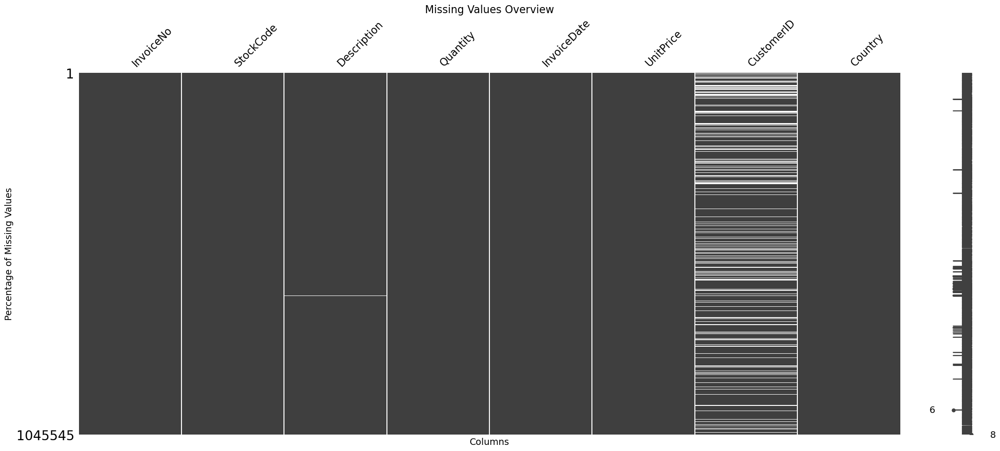

In [26]:
table_summary(data)

In [27]:
# there are still Missing values in Description, So i'll be dropping them 
data = data.dropna(subset=['Description'])

In [28]:
data['Description'] = data['Description'].str.title()

In [29]:
data.shape

(1045182, 8)

In [30]:
data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])

# Extract Year, Quarter, Month, Week, and Day
data['Year'] = data['InvoiceDate'].dt.year
data['Quarter'] = data['InvoiceDate'].dt.quarter
data['Month'] = data['InvoiceDate'].dt.month
data['Week'] = data['InvoiceDate'].dt.isocalendar().week
data['Day'] = data['InvoiceDate'].dt.day
data['TotalPrice']=data['Quantity']*data['UnitPrice']
data['YearQuarter'] = data['InvoiceDate'].dt.to_period("Q")
data['YearMonth'] = data['InvoiceDate'].dt.to_period("M")
data['Date'] = data['InvoiceDate'].dt.date
data['DayOfWeek'] = data['InvoiceDate'].dt.day_name()

In [31]:
total_duplicates = data.duplicated(keep=False).sum()

# Display the total number of duplicate rows
print("Total Number of Duplicates:", total_duplicates)

Total Number of Duplicates: 24920


In [32]:
data=data.drop_duplicates(keep='first')

Although there are approximately 22% missing values in the `CustomerID` field, it's important to note that these entries contribute to the generated income. Therefore, I will retain these values for my analysis

In [33]:
# For analysis purposes, I'm filling the null values in the 'CustomerID' column with '00000' to ensure completeness of the data.
data['CustomerID'] = data['CustomerID'].fillna('00000')
data['CustomerID'] = data['CustomerID'].astype('int64')

In [34]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1031929 entries, 0 to 1045544
Data columns (total 18 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   InvoiceNo    1031929 non-null  object        
 1   StockCode    1031929 non-null  object        
 2   Description  1031929 non-null  object        
 3   Quantity     1031929 non-null  int64         
 4   InvoiceDate  1031929 non-null  datetime64[ns]
 5   UnitPrice    1031929 non-null  float64       
 6   CustomerID   1031929 non-null  int64         
 7   Country      1031929 non-null  object        
 8   Year         1031929 non-null  int32         
 9   Quarter      1031929 non-null  int32         
 10  Month        1031929 non-null  int32         
 11  Week         1031929 non-null  UInt32        
 12  Day          1031929 non-null  int32         
 13  TotalPrice   1031929 non-null  float64       
 14  YearQuarter  1031929 non-null  period[Q-DEC] 
 15  YearMonth    1031929

In [35]:
data.describe(include='all')

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
count,1031929,1031929,1031929,1.031929e+06,1031929,1.031929e+06,1.031929e+06,1031929,1.031929e+06,1.031929e+06,1.031929e+06,1031929.0,1.031929e+06,1.031929e+06,1031929,1031929,1031929,1031929
unique,53265,4743,4740,NaN,NaN,NaN,NaN,43,NaN,NaN,NaN,<NA>,NaN,NaN,9,25,604,7
top,573585,85123A,White Hanging Heart T-Light Holder,NaN,NaN,NaN,NaN,United Kingdom,NaN,NaN,NaN,<NA>,NaN,NaN,2010Q4,2011-11,2011-12-05,Thursday
freq,1114,5752,5752,NaN,NaN,NaN,NaN,947263,NaN,NaN,NaN,<NA>,NaN,NaN,176778,83261,5290,195961
mean,NaN,NaN,NaN,1.009616e+01,2011-01-03 16:20:29.697507328,4.616598e+00,1.183130e+04,NaN,2.010436e+03,2.786267e+00,7.394530e+00,30.054866,1.534869e+01,1.825673e+01,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,-8.099500e+04,2009-12-01 07:45:00,-5.359436e+04,0.000000e+00,NaN,2.009000e+03,1.000000e+00,1.000000e+00,1.0,1.000000e+00,-1.684696e+05,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,1.000000e+00,2010-07-05 12:40:00,1.250000e+00,1.253000e+04,NaN,2.010000e+03,2.000000e+00,4.000000e+00,17.0,8.000000e+00,3.750000e+00,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,3.000000e+00,2010-12-09 13:34:00,2.100000e+00,1.450600e+04,NaN,2.010000e+03,3.000000e+00,8.000000e+00,33.0,1.500000e+01,9.920000e+00,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,1.000000e+01,2011-07-27 13:15:00,4.150000e+00,1.636000e+04,NaN,2.011000e+03,4.000000e+00,1.100000e+01,44.0,2.300000e+01,1.770000e+01,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,8.099500e+04,2011-12-09 12:50:00,3.897000e+04,1.828700e+04,NaN,2.011000e+03,4.000000e+00,1.200000e+01,52.0,3.100000e+01,1.684696e+05,NaN,NaN,NaN,NaN


There are negative values in Quantity. Most of the negative values are Cancelled orders. However, there are values where InvoiceNo number does not contain 'C'

In [36]:
# cancelled=data[data['InvoiceNo'].astype(str).str.contains('C')]

In [37]:
cancelled=data[data['InvoiceNo'].astype(str).str.contains('C')]
filtered_data = data[~data['InvoiceNo'].astype(str).str.contains('C')]
less_than_zero=filtered_data[filtered_data['Quantity']<0]
more_than_zero=filtered_data[(filtered_data['Quantity']>0) & (filtered_data['UnitPrice']>0)]

In [38]:
cancelled.shape

(19076, 18)

In [39]:
display(cancelled)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527,United Kingdom,2010,4,12,48,1,-27.50,2010Q4,2010-12,2010-12-01,Wednesday
154,C536383,35004C,Set Of 3 Coloured Flying Ducks,-1,2010-12-01 09:49:00,4.65,15311,United Kingdom,2010,4,12,48,1,-4.65,2010Q4,2010-12,2010-12-01,Wednesday
235,C536391,22556,Plasters In Tin Circus Parade,-12,2010-12-01 10:24:00,1.65,17548,United Kingdom,2010,4,12,48,1,-19.80,2010Q4,2010-12,2010-12-01,Wednesday
236,C536391,21984,Pack Of 12 Pink Paisley Tissues,-24,2010-12-01 10:24:00,0.29,17548,United Kingdom,2010,4,12,48,1,-6.96,2010Q4,2010-12,2010-12-01,Wednesday
237,C536391,21983,Pack Of 12 Blue Paisley Tissues,-24,2010-12-01 10:24:00,0.29,17548,United Kingdom,2010,4,12,48,1,-6.96,2010Q4,2010-12,2010-12-01,Wednesday
238,C536391,21980,Pack Of 12 Red Retrospot Tissues,-24,2010-12-01 10:24:00,0.29,17548,United Kingdom,2010,4,12,48,1,-6.96,2010Q4,2010-12,2010-12-01,Wednesday
239,C536391,21484,Chick Grey Hot Water Bottle,-12,2010-12-01 10:24:00,3.45,17548,United Kingdom,2010,4,12,48,1,-41.40,2010Q4,2010-12,2010-12-01,Wednesday
240,C536391,22557,Plasters In Tin Vintage Paisley,-12,2010-12-01 10:24:00,1.65,17548,United Kingdom,2010,4,12,48,1,-19.80,2010Q4,2010-12,2010-12-01,Wednesday
241,C536391,22553,Plasters In Tin Skulls,-24,2010-12-01 10:24:00,1.65,17548,United Kingdom,2010,4,12,48,1,-39.60,2010Q4,2010-12,2010-12-01,Wednesday
989,C536506,22960,Jam Making Set With Jars,-6,2010-12-01 12:38:00,4.25,17897,United Kingdom,2010,4,12,48,1,-25.50,2010Q4,2010-12,2010-12-01,Wednesday


In [40]:
cancelled['Quantity'].max()

1

In [41]:
cancelled[cancelled['Quantity']>0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
619406,C496350,M,Manual,1,2010-02-01 08:24:00,373.57,0,United Kingdom,2010,1,2,5,1,373.57,2010Q1,2010-02,2010-02-01,Monday


In [42]:
filtered_data = data[~data['InvoiceNo'].astype(str).str.contains('C')]

In [43]:
filtered_data[filtered_data['Quantity']<0].head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
2498,536589,21777,Recipe Box With Metal Heart,-10,2010-12-01 16:50:00,0.0,0,United Kingdom,2010,4,12,48,1,-0.0,2010Q4,2010-12,2010-12-01,Wednesday
4477,536764,84952C,Mirror Love Bird T-Light Holder,-38,2010-12-02 14:42:00,0.0,0,United Kingdom,2010,4,12,48,2,-0.0,2010Q4,2010-12,2010-12-02,Thursday
7404,536996,22712,Card Dolly Girl,-20,2010-12-03 15:30:00,0.0,0,United Kingdom,2010,4,12,48,3,-0.0,2010Q4,2010-12,2010-12-03,Friday
7405,536997,22028,Penny Farthing Birthday Card,-20,2010-12-03 15:30:00,0.0,0,United Kingdom,2010,4,12,48,3,-0.0,2010Q4,2010-12,2010-12-03,Friday
7406,536998,85067,Cream Sweetheart Wall Cabinet,-6,2010-12-03 15:30:00,0.0,0,United Kingdom,2010,4,12,48,3,-0.0,2010Q4,2010-12,2010-12-03,Friday


In [44]:
filtered_data.shape

(1012853, 18)

In [45]:
filtered_data['UnitPrice'].nunique()

2280

In [46]:
# 1012853
filtered_data['InvoiceNo'].nunique()

44973

There are over 1000k observations with negative quantities, and notably, all these orders are placed by customers with missing `CustomerID` values.

In [47]:
# df=data[~data['InvoiceNo'].astype(str).str.contains('C') & data['Quantity']>0]
df=more_than_zero

In [48]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
0,536365,85123A,White Hanging Heart T-Light Holder,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,2010,4,12,48,1,15.30,2010Q4,2010-12,2010-12-01,Wednesday
1,536365,71053,White Metal Lantern,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,2010,4,12,48,1,20.34,2010Q4,2010-12,2010-12-01,Wednesday
2,536365,84406B,Cream Cupid Hearts Coat Hanger,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,2010,4,12,48,1,22.00,2010Q4,2010-12,2010-12-01,Wednesday
3,536365,84029G,Knitted Union Flag Hot Water Bottle,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,2010,4,12,48,1,20.34,2010Q4,2010-12,2010-12-01,Wednesday
4,536365,84029E,Red Woolly Hottie White Heart.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,2010,4,12,48,1,20.34,2010Q4,2010-12,2010-12-01,Wednesday


In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1007197 entries, 0 to 1045544
Data columns (total 18 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   InvoiceNo    1007197 non-null  object        
 1   StockCode    1007197 non-null  object        
 2   Description  1007197 non-null  object        
 3   Quantity     1007197 non-null  int64         
 4   InvoiceDate  1007197 non-null  datetime64[ns]
 5   UnitPrice    1007197 non-null  float64       
 6   CustomerID   1007197 non-null  int64         
 7   Country      1007197 non-null  object        
 8   Year         1007197 non-null  int32         
 9   Quarter      1007197 non-null  int32         
 10  Month        1007197 non-null  int32         
 11  Week         1007197 non-null  UInt32        
 12  Day          1007197 non-null  int32         
 13  TotalPrice   1007197 non-null  float64       
 14  YearQuarter  1007197 non-null  period[Q-DEC] 
 15  YearMonth    1007197

In [50]:
df.describe(include='all')

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Quarter,Month,Week,Day,TotalPrice,YearQuarter,YearMonth,Date,DayOfWeek
count,1007197,1007197,1007197,1.007197e+06,1007197,1.007197e+06,1.007197e+06,1007197,1.007197e+06,1.007197e+06,1.007197e+06,1007197.0,1.007197e+06,1.007197e+06,1007197,1007197,1007197,1007197
unique,40077,4717,4716,NaN,NaN,NaN,NaN,43,NaN,NaN,NaN,<NA>,NaN,NaN,9,25,604,7
top,573585,85123A,White Hanging Heart T-Light Holder,NaN,NaN,NaN,NaN,United Kingdom,NaN,NaN,NaN,<NA>,NaN,NaN,2010Q4,2011-11,2011-12-05,Thursday
freq,1114,5610,5610,NaN,NaN,NaN,NaN,925371,NaN,NaN,NaN,<NA>,NaN,NaN,172945,81924,5256,190311
mean,NaN,NaN,NaN,1.111759e+01,2011-01-04 09:33:52.730280704,4.074924e+00,1.184725e+04,NaN,2.010437e+03,2.789206e+00,7.403414e+00,30.093323,1.535261e+01,2.031332e+01,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,1.000000e+00,2009-12-01 07:45:00,1.000000e-03,0.000000e+00,NaN,2.009000e+03,1.000000e+00,1.000000e+00,1.0,1.000000e+00,1.000000e-03,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,1.000000e+00,2010-07-06 11:21:00,1.250000e+00,1.253900e+04,NaN,2.010000e+03,2.000000e+00,4.000000e+00,17.0,8.000000e+00,4.130000e+00,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,4.000000e+00,2010-12-09 14:50:00,2.100000e+00,1.452400e+04,NaN,2.010000e+03,3.000000e+00,8.000000e+00,33.0,1.500000e+01,1.008000e+01,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,1.200000e+01,2011-07-28 11:29:00,4.130000e+00,1.636900e+04,NaN,2.011000e+03,4.000000e+00,1.100000e+01,44.0,2.300000e+01,1.770000e+01,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,8.099500e+04,2011-12-09 12:50:00,2.511109e+04,1.828700e+04,NaN,2.011000e+03,4.000000e+00,1.200000e+01,52.0,3.100000e+01,1.684696e+05,NaN,NaN,NaN,NaN


In [51]:
df.shape

(1007197, 18)

Table Summary
Dataframe Shape: (1007197, 18)


,Column Name,Unique Values,Empty Values,Percentage Empty,Data Type
0,InvoiceNo,40077,0,0.0,object
1,StockCode,4717,0,0.0,object
2,Description,4716,0,0.0,object
3,Quantity,520,0,0.0,int64
4,InvoiceDate,37212,0,0.0,datetime64[ns]
5,UnitPrice,2275,0,0.0,float64
6,CustomerID,5879,0,0.0,int64
7,Country,43,0,0.0,object
8,Year,3,0,0.0,int32
9,Quarter,4,0,0.0,int32


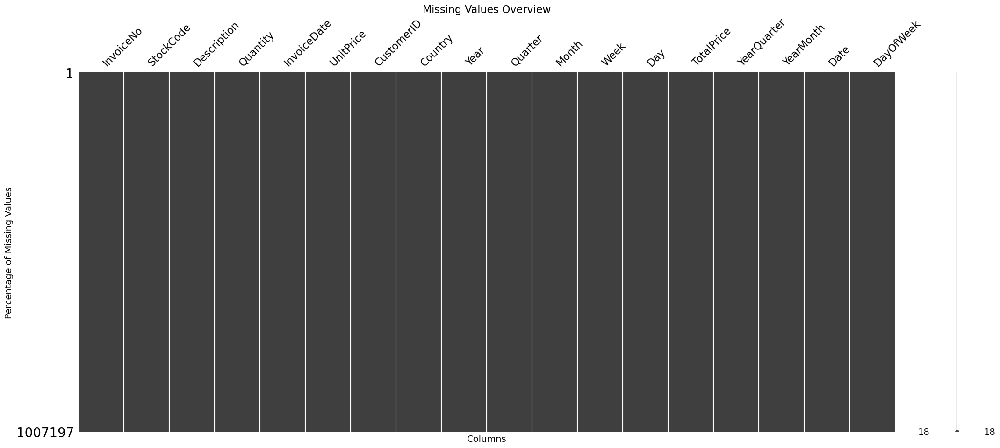

In [52]:
table_summary(df)

In [53]:
# EDA

In [54]:
# How many orders have been placed in total

In [55]:
print(f"There are {df['InvoiceNo'].nunique()} Orders in this Dataset")

There are 40077 Orders in this Dataset


In [56]:
# FInd the number of itemers per order
product_counts = data.groupby('InvoiceNo')['StockCode'].count().reset_index()
display(product_counts.head())

,InvoiceNo,StockCode
0,489434,8
1,489435,4
2,489436,19
3,489437,23
4,489438,17


In [57]:
avg_size_per_invoice = data.groupby('InvoiceNo')['StockCode'].count().mean()
print(f'Avg Basket Size per order is {avg_size_per_invoice}')

Avg Basket Size per order is 19.373491035389094


In [58]:
# Finding the totalCost per order
totalCost_counts = data.groupby('InvoiceNo')['TotalPrice'].sum().reset_index()
display(totalCost_counts.head())

,InvoiceNo,TotalPrice
0,489434,505.30
1,489435,145.80
2,489436,630.33
3,489437,310.75
4,489438,2286.24


In [59]:
avg_cost_per_invoice = data.groupby('InvoiceNo')['TotalPrice'].sum().mean()
print(f'Avg Cost per order is {avg_cost_per_invoice}')

Avg Cost per order is 353.69651117994925


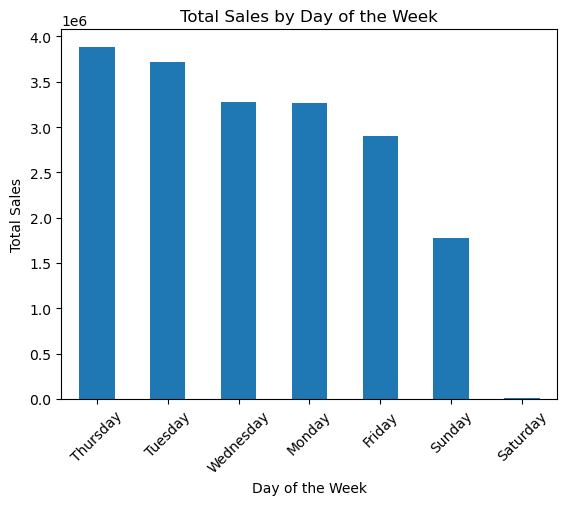

In [60]:
# Fing the day with the highest purchase 

# Group by day of the week, then calculate total sales and sort
total_cost_per_day = data.groupby(['DayOfWeek'])['TotalPrice'].sum().reset_index()
total_cost_per_day = total_cost_per_day.sort_values(by='TotalPrice', ascending=False)

# Plot the bar chart
ax = total_cost_per_day.plot(kind='bar', x='DayOfWeek', y='TotalPrice', legend=False, rot=45)

# Set title, x-axis label, and y-axis label
plt.title('Total Sales by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Total Sales')

# Display the plot
plt.show()


In [61]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'Year', 'Quarter', 'Month',
       'Week', 'Day', 'TotalPrice', 'YearQuarter', 'YearMonth', 'Date',
       'DayOfWeek'],
      dtype='object')

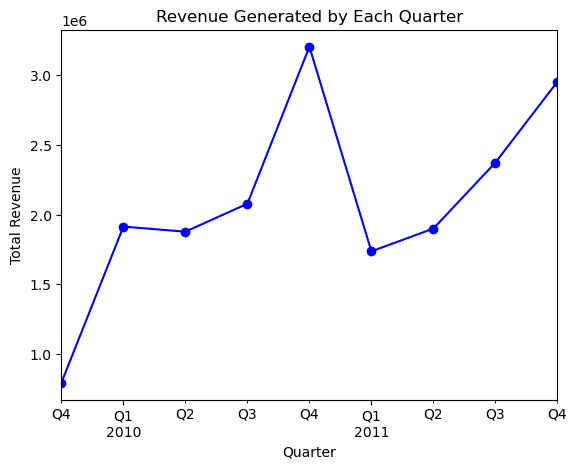

In [62]:
import matplotlib.pyplot as plt

# Assuming 'YearQuarter' is the column representing the quarter
revenue_by_quarter = data.groupby('YearQuarter')['TotalPrice'].sum().reset_index()

# Plot the line chart
ax = revenue_by_quarter.plot(kind='line', x='YearQuarter', y='TotalPrice', marker='o', linestyle='-', color='b', legend=False)

# Set title, x-axis label, and y-axis label
plt.title('Revenue Generated by Each Quarter')
plt.xlabel('Quarter')
plt.ylabel('Total Revenue')

# Display the plot
plt.show()


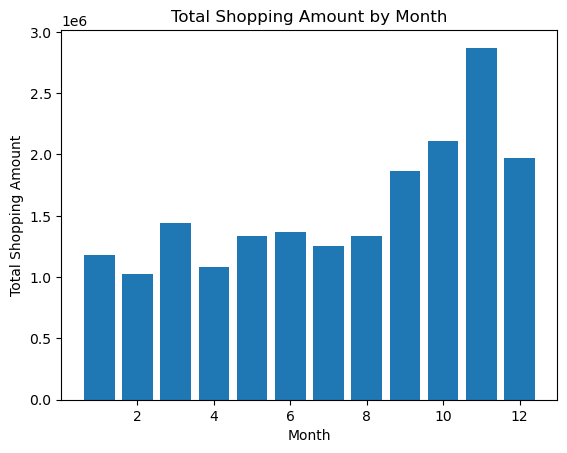

In [63]:

shopping_by_month = data.groupby('Month')['TotalPrice'].sum().reset_index()

# Plot the bar chart
plt.bar(shopping_by_month['Month'], shopping_by_month['TotalPrice'])

# Set title, x-axis label, and y-axis label
plt.title('Total Shopping Amount by Month')
plt.xlabel('Month')
plt.ylabel('Total Shopping Amount')

# Display the plot
plt.show()


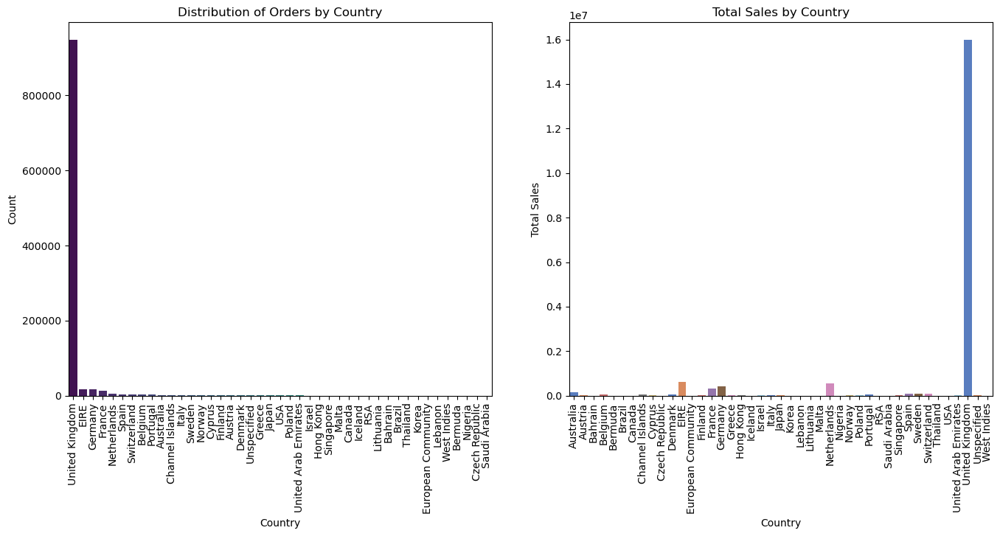

In [64]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# Plot 1: Country distribution
sns.countplot(x='Country', data=data, ax=axes[0], order=data['Country'].value_counts().index, palette='viridis')
axes[0].set_title('Distribution of Orders by Country')
axes[0].set_xlabel('Country')
axes[0].set_ylabel('Count')

# Plot 2: TotalPrice by Country
sns.barplot(x='Country', y='TotalPrice', data=data.groupby('Country')['TotalPrice'].sum().reset_index(), ax=axes[1], palette='muted')
axes[1].set_title('Total Sales by Country')
axes[1].set_xlabel('Country')
axes[1].set_ylabel('Total Sales')

# Adjust layout to prevent overlapping
plt.tight_layout()

# # Rotate x-axis labels for better readability
axes[0].tick_params(axis='x', rotation=90)
axes[1].tick_params(axis='x', rotation=90)

# Display the subplots
plt.show()


In [65]:
# Most of the orders are from United Kingdoms, As a reslt

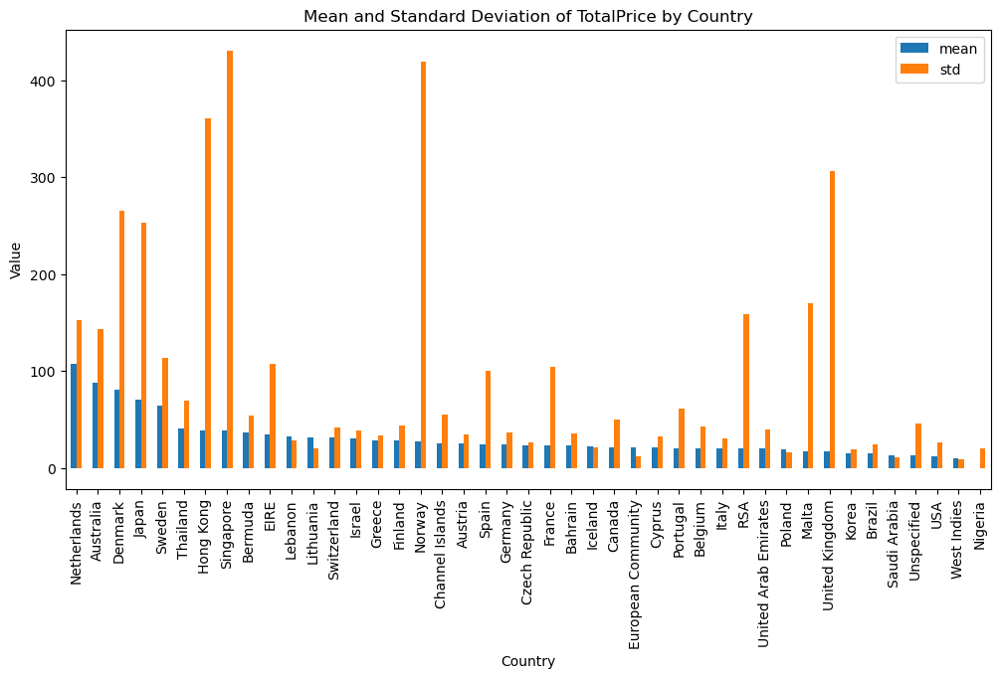

In [66]:
# Group by country and calculate mean and standard deviation of TotalPrice
country_stats = data.groupby('Country')['TotalPrice'].agg(['mean', 'std']).sort_values(by='mean', ascending=False).reset_index()

# Set the plot size
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the bar chart
country_stats.plot(kind='bar', x='Country', y=['mean', 'std'], ax=ax, legend=True)

# Set title, x-axis label, and y-axis label
plt.title('Mean and Standard Deviation of TotalPrice by Country')
plt.xlabel('Country')
plt.ylabel('Value')

# Display the plot
plt.show()


In [67]:
# RFM
# Customer Segment
# Time Series analysis (if can)

In [68]:
# https://medium.com/@ugursavci/complete-exploratory-data-analysis-using-python-9f685d67d1e4 need to do this 

# RFM
RFM (Recency, Frequency, Monetary Value) is a marketing analysis model that categorizes customers based on their recent activity, purchase frequency, and monetary contributions. It helps businesses identify segments like high-value customers for targeted marketing, re-engage at-risk customers, and tailor strategies based on customer behavior.
RECENCY (R): Days since last purchase  
FREQUENCY (F): Total number of purchases  
MONETARY VALUE (M): Total money this customer spent.  

In [77]:
last_date=df['Date'].max()

In [78]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'Year', 'Quarter', 'Month',
       'Week', 'Day', 'TotalPrice', 'YearQuarter', 'YearMonth', 'Date',
       'DayOfWeek'],
      dtype='object')

In [79]:
# Finding the customers and their last purchase date
recency=df.groupby('CustomerID')['Date'].max().reset_index()
display(recency.head())

,CustomerID,Date
0,0,2011-12-09
1,12346,2011-01-18
2,12347,2011-12-07
3,12348,2011-09-25
4,12349,2011-11-21


In [80]:
recency['Recency']=recency['Date'].apply(lambda x: (last_date-x).days)
display(recency.head())

,CustomerID,Date,Recency
0,0,2011-12-09,0
1,12346,2011-01-18,325
2,12347,2011-12-07,2
3,12348,2011-09-25,75
4,12349,2011-11-21,18


We can see it has been 325 days since CustomerID 12346 purchased anything

In [ ]:
# Frequency 

In [97]:
# Find the number of time a custeomer has made a purchase
frequency=df.groupby('CustomerID')['InvoiceNo'].count().reset_index()
frequency.columns = ['CustomerID','Frequency']
display(frequency.head())

,CustomerID,Frequency
0,0,228329
1,12346,34
2,12347,222
3,12348,51
4,12349,175


In [ ]:
# Monetary

In [87]:
# Finding how much each customer has spent overall 
monetary=df.groupby('CustomerID')['TotalPrice'].sum().reset_index()
monetary.columns = ['CustomerID','Monetary']
display(monetary.head())

,CustomerID,Monetary
0,0,3100701.42
1,12346,77556.46
2,12347,4921.53
3,12348,2019.40
4,12349,4428.69


In [103]:
# Creating a RFM Table
rf_table = recency.merge(frequency, on='CustomerID')
rfm_table=rf_table.merge(monetary, on='CustomerID')
rfm=rfm_table.drop('Date', axis=1)
rfm=rfm[rfm['CustomerID']!=0]
display(rfm.head())

,CustomerID,Recency,Frequency,Monetary
1,12346,325,34,77556.46
2,12347,2,222,4921.53
3,12348,75,51,2019.40
4,12349,18,175,4428.69
5,12350,310,17,334.40


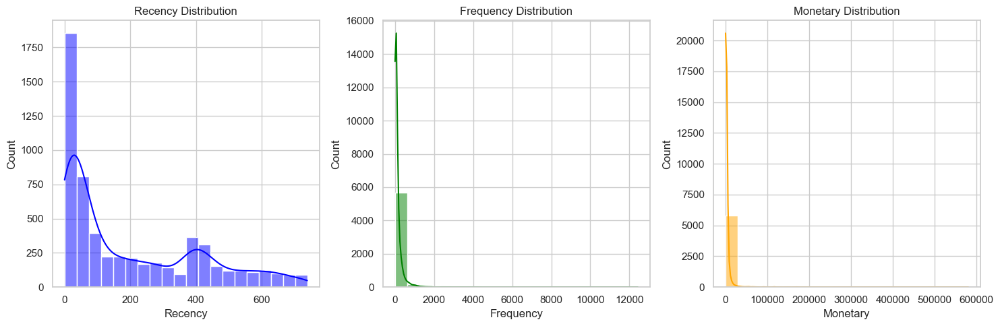

In [105]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'rfm' with columns 'Recency', 'Frequency', 'Monetary'
# You can adjust column names based on your actual column names

# Set the style for the plots
sns.set(style="whitegrid")

# Create a subplot layout
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plotting displots for Recency, Frequency, and Monetary
sns.histplot(rfm['Recency'], bins=20, kde=True, color='blue', ax=axes[0])
axes[0].set_title('Recency Distribution')
axes[0].set_xlabel('Recency')

sns.histplot(rfm['Frequency'], bins=20, kde=True, color='green', ax=axes[1])
axes[1].set_title('Frequency Distribution')
axes[1].set_xlabel('Frequency')

sns.histplot(rfm['Monetary'], bins=20, kde=True, color='orange', ax=axes[2])
axes[2].set_title('Monetary Distribution')
axes[2].set_xlabel('Monetary')

plt.tight_layout()
plt.show()


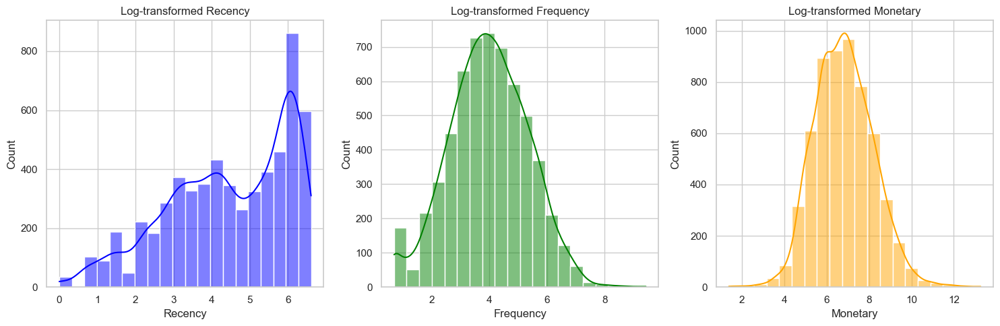

In [106]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'rfm' is your DataFrame with columns 'Recency', 'Frequency', and 'Monetary'

# Apply log transformation
rfm_log = np.log1p(rfm[['Recency', 'Frequency', 'Monetary']])

# Plot histograms of the log-transformed data
plt.figure(figsize=(15, 5))

# Recency
plt.subplot(1, 3, 1)
sns.histplot(rfm_log['Recency'], bins=20, kde=True, color='blue')
plt.title('Log-transformed Recency')

# Frequency
plt.subplot(1, 3, 2)
sns.histplot(rfm_log['Frequency'], bins=20, kde=True, color='green')
plt.title('Log-transformed Frequency')

# Monetary
plt.subplot(1, 3, 3)
sns.histplot(rfm_log['Monetary'], bins=20, kde=True, color='orange')
plt.title('Log-transformed Monetary')

plt.tight_layout()
plt.show()


In [ ]:
# Customer Segmentation using K-Means clustering (RFM)

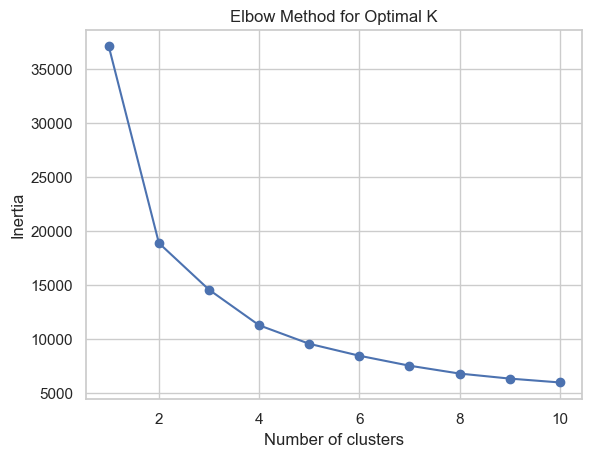

In [108]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

inertias = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(rfm_log)  # 'data' is your RFM table
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 11), inertias, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()


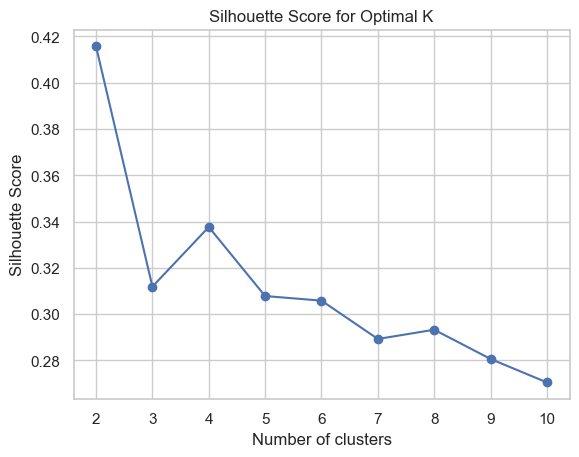

In [111]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(rfm_log)  # 'data' is your RFM table
    score = silhouette_score(rfm_log, labels)
    silhouette_scores.append(score)

plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal K')
plt.show()


In [113]:
pip install gap-stat


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for gap-stat: filename=gap_stat-2.0.3-py3-none-any.whl size=6133 sha256=bbb09313d472079bad0f658b39655114b1a5f3b7dd40c0d9344adc2008f862b9
  Stored in directory: /Users/vishak/Library/Caches/pip/wheels/20/56/24/2a593b1a12d055f6283ca90cadcfbcbd790032b8dfdf407431
Successfully built gap-stat
Note: you may need to restart the kernel to use updated packages.


In [114]:
from gap_statistic import OptimalK

optimalK = OptimalK(parallel_backend='multiprocessing')
n_clusters = optimalK(rfm_log, cluster_array=np.arange(1, 11))
print(f'Optimal number of clusters: {n_clusters}')


Optimal number of clusters: 8


In [90]:
# Customer Segmentation using K-Means clustering (RFM)

# What are the most bought products
# How many online customers are there in the dataset and what is their country of origin?

# Calculate the revenue that was made in each month and what is the percentage revenue based on countries?

# Build a machine learning model to estimate if a given customer will buy something again from the online shop in the next quarter.


# See if theres relation between number of invoice and total money spent 

In [ ]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# from pandas.tseries.offsets import MonthBegin

# # Assuming you have a DataFrame named 'data' with columns 'InvoiceDate', 'Amount', 'InvoiceNo'

# # Convert 'InvoiceDate' to datetime if not already
# data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])

# # Create 'IsCancelled' column
# data['IsCancelled'] = data['InvoiceNo'].str.startswith('C')

# # Group by month and perform summarization
# monthly_sales_data = (data.groupby(pd.Grouper(key='InvoiceDate', freq='MS'))
#                      .agg(monthly_total_sales=('TotalPrice', 'sum'),
#                           monthly_cancellations=('IsCancelled', 'sum'),
#                           monthly_net_sales=('TotalPrice', 'sum', 'IsCancelled', 'sum'))
#                      .reset_index())

# # Calculate the correct 'monthly_net_sales'
# monthly_sales_data['monthly_net_sales'] = monthly_sales_data['monthly_total_sales'] - monthly_sales_data['monthly_cancellations']

# # Plotting
# plt.figure(figsize=(10, 6))

# plt.plot(monthly_sales_data['InvoiceDate'], monthly_sales_data['monthly_total_sales'], label='Total Sales', color='blue', linewidth=1.2)
# plt.plot(monthly_sales_data['InvoiceDate'], monthly_sales_data['monthly_cancellations'], label='Cancellations', color='red', linewidth=1.2)
# plt.plot(monthly_sales_data['InvoiceDate'], monthly_sales_data['monthly_net_sales'], label='Net Sales', color='green', linewidth=1.2)

# plt.title("Monthly Sales Trends")
# plt.xlabel("Month")
# plt.ylabel("Amount in GBP")
# plt.legend()
# plt.grid(True)
# plt.show()


In [ ]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# from pandas.tseries.offsets import MonthBegin

# # Assuming you have a DataFrame named 'data' with columns 'InvoiceDate', 'Amount', 'InvoiceNo'

# # Convert 'InvoiceDate' to datetime if not already
# data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])

# # Create 'IsCancelled' column
# data['IsCancelled'] = data['InvoiceNo'].str.startswith('C')

# # Group by month and perform summarization
# monthly_sales_data = (data.groupby(pd.Grouper(key='InvoiceDate', freq='MS'))
#                      .agg(monthly_total_sales=('TotalPrice', 'sum'),
#                           monthly_cancellations=('IsCancelled', 'sum'))
#                      .reset_index())

# # Calculate 'monthly_net_sales' using a custom aggregation function
# def calculate_monthly_net_sales(group):
#     total_sales = group['TotalPrice'].sum()
#     cancellations = group['IsCancelled'].sum()
#     return total_sales - cancellations

# monthly_net_sales = data.groupby(pd.Grouper(key='InvoiceDate', freq='MS')).apply(calculate_monthly_net_sales).reset_index(name='monthly_net_sales')

# # Merge the DataFrames on 'InvoiceDate'
# monthly_sales_data = pd.merge(monthly_sales_data, monthly_net_sales, on='InvoiceDate', how='outer')

# # Plotting
# plt.figure(figsize=(10, 6))

# plt.plot(monthly_sales_data['InvoiceDate'], monthly_sales_data['monthly_total_sales'], label='Total Sales', color='blue', linewidth=1.2)
# plt.plot(monthly_sales_data['InvoiceDate'], monthly_sales_data['monthly_cancellations'], label='Cancellations', color='red', linewidth=1.2)
# plt.plot(monthly_sales_data['InvoiceDate'], monthly_sales_data['monthly_net_sales'], label='Net Sales', color='green', linewidth=1.2)

# plt.title("Monthly Sales Trends")
# plt.xlabel("Month")
# plt.ylabel("Amount in GBP")
# plt.legend()
# plt.grid(True)
# plt.show()


In [ ]:
STOP

In [ ]:
data.shape

In [ ]:
(f'''{more_than_zero.shape},
{less_than_zero.shape},
{filtered_data.shape},
{cancelled.shape},
{data.shape}''')